# vectorize

> Fill in a module description here

In [ ]:
#| hide
from nbdev.showdoc import *

In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
import io
import json
import math
import os

import autotrace
import numpy as np
import pandas as pd
from PIL import Image

# import tensorflow as tf
# from tensorboard.plugins import projector


# from fastai.vision.all import *
# from portfolio_search.embeddings import *
# from portfolio_search.fileorg import *

## Loading TSV's and Input Images

In [ ]:
autotrace_dir = "{singleline_data_home()}/svg/epoch-20231214/"

In [ ]:
preprocessed_dir = (
    singleline_data_home() / "raster/epoch-20231214/10_SIMPLE_CROP"
)
clustered_drawings_tsv_fname = f"{preprocessed_dir}/clustered_drawings.tsv"
clustered_drawings_df = pd.read_csv(
    clustered_drawings_tsv_fname, delimiter="\t", index_col="idx"
)
cdf = clustered_drawings_df
cdf.head()

,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv,cluster,cluster_dist,metacluster,...,drawings_cluster48_id,drawings_cluster48_dist,drawings_cropped_cluster16_id,drawings_cropped_cluster16_dist,drawings_cropped_cluster32_id,drawings_cropped_cluster32_dist,drawings_cropped_cluster48_id,drawings_cropped_cluster48_dist,drawings_cropped_cluster64_id,drawings_cropped_cluster64_dist
idx,,,,,,,,,,,,,,,,,,,,,
0,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datase...,art/sb77p043.jpg,art,xtra,4,"0.168532,0.008473,0.008068,0.016940,0.797986","-0.6198182,-0.5714155,-0.6871516,-0.6553513,-0...",11,199.22961,1,...,15,166.33705,15,265.844100,15,257.350560,15,268.67297,58,276.82034
1,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datase...,art/sb67p021.jpg,art,xtra,4,"0.170976,0.008673,0.008480,0.017028,0.794843","1.1073987,0.3512016,-0.73929733,-0.6553513,1.7...",3,132.26111,0,...,45,137.20117,14,121.146545,31,122.172424,31,116.40921,34,122.04242
2,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datase...,art/sb25p227.jpg,art,xtra,4,"0.158396,0.008277,0.007424,0.016584,0.809319","1.3776337,-0.5714155,-0.2587232,-0.6553513,1.3...",8,188.58075,0,...,8,148.63470,10,220.298950,1,217.335360,1,213.25168,1,191.67163
3,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datase...,art/sb48p057.jpg,art,xtra,4,"0.165322,0.008453,0.008010,0.016587,0.801628","2.4936543,0.17563903,-0.6522293,-0.55642915,1....",14,90.26291,0,...,28,83.96362,2,144.254030,21,129.951970,21,140.07254,21,144.77570
4,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datase...,art/sb77p044.jpg,art,xtra,4,"0.171638,0.008182,0.008061,0.016469,0.795650","2.170152,-0.01916939,-0.47766963,-0.6553513,-0...",4,176.29102,0,...,39,169.47894,15,151.277310,15,141.268980,15,145.39337,58,151.13809


In [ ]:
cdf.columns

Index(['abs_fname', 'rel_fname', 'label', 'pred_label', 'pred_idx',
       'pred_probs', 'emb_csv', 'cluster', 'cluster_dist', 'metacluster',
       'metacluster_name', 'indiv_fname', 'visual_rel_path', 'visual_abs_path',
       'handlabeled_rel_path', 'handlabeled_metacluster_name',
       'handlabeled_metacluster_id', 'handlabeled_metacluster_was_correct',
       'preprocessed_abs_path', 'handlabeled_abs_path', 'emb_csv_cropped',
       'drawings_cluster_id', 'drawings_cluster_dist',
       'drawings_cropped_cluster_id', 'drawings_cropped_cluster_dist',
       'drawings_cluster32_id', 'drawings_cluster32_dist',
       'drawings_cluster16_id', 'drawings_cluster16_dist',
       'drawings_cluster64_id', 'drawings_cluster64_dist',
       'drawings_cluster48_id', 'drawings_cluster48_dist',
       'drawings_cropped_cluster16_id', 'drawings_cropped_cluster16_dist',
       'drawings_cropped_cluster32_id', 'drawings_cropped_cluster32_dist',
       'drawings_cropped_cluster48_id', 'drawings_cr

In [ ]:
cols_subset = [
    "indiv_fname",
    "visual_rel_path",
    "visual_abs_path",
    "handlabeled_rel_path",
    "handlabeled_metacluster_name",
    "handlabeled_metacluster_id",
    "handlabeled_metacluster_was_correct",
    "preprocessed_abs_path",
    "handlabeled_abs_path",
    "emb_csv_cropped",
    "drawings_cluster_id",
    "drawings_cluster_dist",
]
cdf[cols_subset].head()

,indiv_fname,visual_rel_path,visual_abs_path,handlabeled_rel_path,handlabeled_metacluster_name,handlabeled_metacluster_id,handlabeled_metacluster_was_correct,preprocessed_abs_path,handlabeled_abs_path,emb_csv_cropped,drawings_cluster_id,drawings_cluster_dist
idx,,,,,,,,,,,,
0,sb77p043.jpg,1_watercolors/sb77p043.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datase...,0_drawings/sb77p043.jpg,0_drawings,0,False,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datase...,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datase...,"-0.6198182,-0.5714155,0.2937309,0.2691822,-0.6...",3,217.249590
1,sb67p021.jpg,0_drawings/sb67p021.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datase...,0_drawings/sb67p021.jpg,0_drawings,0,True,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datase...,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datase...,"-0.20756221,-0.24843562,0.29454154,-0.6553513,...",2,169.947700
2,sb25p227.jpg,0_drawings/sb25p227.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datase...,0_drawings/sb25p227.jpg,0_drawings,0,True,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datase...,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datase...,"-0.6198182,-0.428226,-0.73929733,-0.6553513,-0...",3,162.882430
3,sb48p057.jpg,0_drawings/sb48p057.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datase...,0_drawings/sb48p057.jpg,0_drawings,0,True,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datase...,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datase...,"-0.34353483,-0.5714155,2.2665114,-0.6553513,-0...",4,94.257965
4,sb77p044.jpg,0_drawings/sb77p044.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datase...,0_drawings/sb77p044.jpg,0_drawings,0,True,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datase...,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datase...,"-0.3477007,-0.5714155,-0.73929733,-0.6553513,-...",0,173.559940


In [ ]:
cdf["autotrace_abs_path"] = cdf.handlabeled_rel_path.map(
    lambda p: os.path.join(autotrace_dir, p.replace(".jpg", ".svg"))
)

In [ ]:
# limit = 5
# for idx in range(len(cdf)):
#     if idx > limit:
#         break
#     row = cdf.iloc[idx]
#     print(row.preprocessed_abs_path, row.autotrace_abs_path)

#     dest_dir = os.path.dirname(row.autotrace_abs_path)
#     if not os.path.isdir(dest_dir):
#         os.makedirs(dest_dir)

#     image = np.asarray(Image.open(row.preprocessed_abs_path).convert("RGB"))
#     bitmap = autotrace.Bitmap(image)

#     # Trace the bitmap. Options:
#     # - https://github.com/lemonyte/pyautotrace/blob/main/autotrace/autotrace.py#L83
#     vector = bitmap.trace(centerline=True, error_threshold=8.0, filter_iterations=4)
#     vector.save(row.autotrace_abs_path)

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb77p043.jpg /Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p043.svg
/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb67p021.jpg /Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p021.svg
/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb25p227.jpg /Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p227.svg
/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb48p057.jpg /Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p057.svg
/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb77p044.jpg /Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p044.svg
/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/f

In [ ]:
input_jpg = singleline_data_home() / "raster/epoch-20231214/10_SIMPLE_CROP/0_drawings/sb77p043.jpg"
input_fname = "{singleline_data_home()}/svg/epoch-20231214/0_drawings/sb77p043.svg"

In [ ]:
%%bash

CENTERLINE_TRACE_DIR="/Users/al/code/_svg/inkscape-centerline-trace"
INPUT_DIR=singleline_data_home() / "raster/epoch-20231214/10_SIMPLE_CROP/0_drawings"
OUTPUT_DIR="{singleline_data_home()}/svg/epoch-20231214/0_drawings"

for file in $(ls $INPUT_DIR); do
    export idx=$(basename $file .jpg)
    export inpath=$INPUT_DIR/$file
    export outpath=$OUTPUT_DIR/$idx.svg
    if ! [ -f $outpath ]; then
        echo "$outpath does not exist."
        $CENTERLINE_TRACE_DIR/centerline-trace.sh $inpath > $outpath
    else
        echo "$outpath exists; skipping."
    fi
done

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p007.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p009.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p011.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p015.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p016.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p021--all-wound-up.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p025.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p033.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p034.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p040--look-eyes.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p042--look-squares.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p046.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p048--uplift.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p050.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p054--upward-squiggle.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p058.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p060.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p062--covid-bleach.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p066.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p068--mi6-mom.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p070.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p080.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p082.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p084.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p086.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p088--attention.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p090--bated-breath.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p092.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p094.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p096.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p098.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p100.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p102--low-five.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p104.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p106.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p108.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p110.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p111.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p113.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p115.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p117.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p119.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p121.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p122.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p124.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p126--crosshatch-lips.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p128--hierarchy.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p130--stamp.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p130.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p132.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p134.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p138.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p141--heiro-one-col.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p143--heiro-four-cols.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p145--heiro-five-cols.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p147--heiro-six-cols.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p149--heiro.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb00p151--heiro-seven-cols.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb05p019-b.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb05p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb05p020.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb05p021.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb05p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb05p051-color.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb05p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb05p052-color.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb05p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb05p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb05p064-color.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb05p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb05p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb05p067.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb05p069.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb05p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb05p072.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb05p073.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb05p088.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb05p097.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb05p108.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb05p121.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb07p050.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb07p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb07p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb07p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb07p054.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb07p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb07p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb07p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb07p091.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p006.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p007.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p008.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p009.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p010.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p011.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p012.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p014.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p016.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p021.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p022.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p024.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p025.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p026.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p032.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p033.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p034.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p035.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p037.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p039.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p045.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p046.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p048.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p050.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p054.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p058.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p059.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p060.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p061.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p062.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p066.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p067.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p068.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p069.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p070.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p072.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p073.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p074.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p077.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p080.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p082.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p083.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p084.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p085.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p086.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p087.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p088.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p089.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p090.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p091.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p092.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p093.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb11p101.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p001.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p002.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p003.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p010.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p011.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p021.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p025.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p033.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p035.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p039.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p041.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p042.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p043.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p045.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p059.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p061.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p067.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p069.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p073.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p077.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p083.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p085.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p087.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p089.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p095.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p097.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p099.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p101.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p103.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p105.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p107.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p109.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p111.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p113.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p115.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p120.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p121.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p122.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p123.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p124.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p125.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p126.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p127.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p129.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p133.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p135.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p137.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p139.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p141.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p143.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p145.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p150.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p151.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p153.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p154.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p155.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p156.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p157.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p158.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p159.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p160.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p161.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p162.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p163.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p169.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p171.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p172.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p173.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p174.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p175.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p176.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p177.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p179-whats-in-a-sketchbook.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p183.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p185.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p187.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p189.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p191.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p193.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p195.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p197.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p199.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p205.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p209.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p215.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p217.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p219.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p220.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p221.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p226.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p227.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p239.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p241.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p243.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p245.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p247.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p249.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb25p251.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p000.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p001.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p002.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p003.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p006.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p007.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p008.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p014.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p015.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p022.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p024.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p025.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p026.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p029--did-i-shower.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p032.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p037.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p039.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p040.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p041.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p042.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p043.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p045.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p046.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p048.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p050.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p058.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p059.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p060.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p061--negative-space.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p062--bird-watching.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p063--cherchez.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p064--yoga.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb26p065--dispute.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p016--2021-04-25.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p020.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p022--2021-05-03.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p034.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p035.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p042.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p044--diag-quarter.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p046.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p048.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p054.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p058.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p059.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p066.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p067.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p068.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p069.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p070.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p072.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p073.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p074.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p082.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p083.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p084.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p085.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p086.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p087.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p088.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p089.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p090.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p091.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p092.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/copy.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p092.svg exists; skipping.
/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p093.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p094.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p095.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p096.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p097.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p098.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p099.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p100.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p101.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p102.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p103.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p104.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p105.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p106.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p107.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p108.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p109.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p110.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p111.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p112.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p113.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p114.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p115.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p116.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb28p117.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p001--side-eye.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p003--peach-top.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p005--dino-defender.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p007--jelly-commander.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p008--karma-yoga.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p011--jeff-tezos.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p012.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p014-stamp.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p014.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p015-stamp.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p015.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p042.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p043.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p045.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p046.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p050.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p052--hands-practice.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p053--hands-timecheck.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p054.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p058--body-sizes.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p059.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p067-light.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p072.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p074.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p080.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p084.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p086.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p087--parents.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p088.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p089--trader-joes.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p090.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p091.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p092.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p093.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p094.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p095--dayumm.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p096.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p097.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p098--maybe.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb31p099.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p002.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p003.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p006.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p008.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p015.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p016.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p017.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p020.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p032.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p037.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p043.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p046.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p048.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p050.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p066.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p067.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p068.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p069.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p070.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p077.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p080.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p085.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p086.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p090.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p091.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p092.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p093.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p094.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p095.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p096.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p097.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p098.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p099.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p100.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p101.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p102.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p103.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p104.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p105.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p106.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p107.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p108.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p109.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p110.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p111.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p112.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p113.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p114.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p115.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p116.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p117.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p118.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p119.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb32p120.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p017.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p021.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p022.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p024.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p025.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p033.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p039.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p040.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p041.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p042.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p045.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p054.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p056--the-point.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p058--hairswoosh.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p059.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p060.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p065--eyes-and-noses.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p066.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p067.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p068.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p069.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p070--downbeat-disco.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p072.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p073--tinybodies.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p074.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p077--posturing.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p080.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p082.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p083.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p084.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p085.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p086.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p087.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p088.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p089.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p090.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p091.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p092--antenna.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p093.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p094.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p095--selfpoint.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p096--radhaus-friday.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p097--pair-phone.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p098--barstool.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p099.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p100.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p101.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p109.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p110--look.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p111.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p113.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p116--negative-hug.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p117--robo-spring.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p118.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p119.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb35p120.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p001.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p002.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p003.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p006.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p007--please-dont.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p008.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p009.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p010.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p011.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p014.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p015.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p016.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p017.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p020.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p021.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p022.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p024.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p025.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p026.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p032.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p033.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p034.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p035.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p037.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p039.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p040.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p041.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p042.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p043.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p045.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p046.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p048.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p050.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p053--gown.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p054.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p058.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p059.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p062--microcosm.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p066--artdeco.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p067--wince.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p068--slash0.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p069--slash1.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p070--slash2.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p071--slash3.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p072--daemon.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p073--gown2.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p074--crosslegged.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p078--donkeys1.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p079--donkeys2.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p080--donkeys3.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p082--diag1.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p085.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p086.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p088.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p089--gown3.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p093.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p094--aboutme.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p095.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p096--bundled.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p097.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p098--eyesclosed-rounded.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p099.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p100.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p101.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p102.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p103.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p104--diag.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p105--minfig.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p106.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p107.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p108.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p109.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p110.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p111.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p112.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p113.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p114.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p115.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p116.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p117.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p118.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p119.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb38p120.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p001.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p002.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p003.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p006--diagchains.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p007.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p008.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p009.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p010.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p011.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p012.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p014.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p015.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p016--cafedoggy.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p017.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p020.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p021--cafedoggy2.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p022.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p024.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p025.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p026--manifesting.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p032.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p033.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p034.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p035.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p039--square.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p040--radiate.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p041--de-platformed.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p042.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p043.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p045--supermin.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p046.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p048.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p050.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p054--spiral.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p055--wintercoats.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p058.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p059--high-alert.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p060--tadaa.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p061.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p062.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p066.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p067.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p068.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p069.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p070.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p072.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p073.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p074.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p077.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p080.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p093.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p094.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p096.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p098.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p099.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p100.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p101.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p102.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p103.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p104.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p105.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p106.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p107.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p108.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p109.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p110.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p111.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p112.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p113.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p114.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p115.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p116.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p117.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p118.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p119.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p120.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb42p121.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p001.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p002.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p003.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p006.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p007.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p008.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p009.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p010.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p011.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p012.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p014.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p015.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p016.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p017.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p020.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p021.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p022.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p024.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p025.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p026.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p032.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p033.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p034.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p035.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p037.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p039.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p040.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p041.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p042.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p043.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p045.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p046.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p048.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p050.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p054.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p058.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p060.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p061.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p062.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p066.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p067.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p068.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p070.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p072.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p073.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p074.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p077--full-diag.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p082.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p083--sneer.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p084.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p085--littlehat.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p086.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p087.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p088.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p089.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p090.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p091.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p092.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p093.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p094.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p095.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p096.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p097.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p098.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p099.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p100.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p101.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p102.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p103.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p104.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p105.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p106.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p107.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p108.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p109.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p110.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p111.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p112.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p113.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p114.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p115.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p116.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p117.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p118.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p118v2.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb44p119.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p001.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p002.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p003--diagchains.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p006.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p007.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p008.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p009.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p010.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p011.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p012.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p014.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p015.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p016.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p017.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p020--onfire.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p021.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p022.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p024.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p025.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p026.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p032.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p033.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p034.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p035.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p037.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p038--point2point.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p039.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p042.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p043.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p045.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p046.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p050--diag.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p054--diag2.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p058.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p059.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p060.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p061.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p062.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p066--min1.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p067--min2.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p068.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p069.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p070.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p072.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p073--min3.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p074.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p077.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p080.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p082.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p083.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p084.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p085.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p086--min4.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p087.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p088.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p089--winnie1.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p090--winnie2.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p091--winnie3.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p092--winnie4.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p093--winnie5.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p094--winnie6.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p095--winnie7.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p096--winnie8.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p097--min5.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p098.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p099.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p100.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p101.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p102.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p103.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p104.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p105.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p106.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p107.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p108.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p109.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p110.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p111.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p112.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p113.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p114.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p115.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p116.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p117.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p118.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p119--toomin.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p120.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p121.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb45p122.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p001.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p002.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p003.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p006.ec.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p007.ec.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p008.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p009.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p010.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p011.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p012.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p016.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p017.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p020.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p021.ec.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p022.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p024.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p025.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p026.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p032.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p033.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p034.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p035.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p037.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p039.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p040.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p041--fuzzy.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p043-light.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p045-light.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p047-light.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p049-light.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p055-light.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p062.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p080.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p082.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p083.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p084.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p094-nonOverlap.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p095.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p096-angular.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p097-attitude.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p098.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p099.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p100.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p101.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p102.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p103.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p104.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p105.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p109.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p110.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p111.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p112.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p113.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p114.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p115.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p116.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p117.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p118.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p119.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb46p120.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p001.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p002.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p003.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p006.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p007.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p008.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p009.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p010.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p011.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p012.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p014.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p015.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p016.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p017.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p020.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p021.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p022.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p024.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p025.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p026.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p032.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p033.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p034.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p035.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p037.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p039.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p040.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p041.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p042.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p043.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p045.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p046.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p048.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p050.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p054.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p058.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p059.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p060.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p061.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p062.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p066.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p067.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p068.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p069.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p070.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p072.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p073.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p074.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p077.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p080.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p082.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p083.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p084.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p085.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p086.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p087.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p088.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p089.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p090.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p091.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p092.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p093.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p094.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p095.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p096.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p097.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p098.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p099.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p100.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p101.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p102.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p103.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p104.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p105.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p106.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p107.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p108.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p109.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p110.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p111.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p112.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p113.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p114.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p115.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p116.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p117.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb48p118.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p001.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p002.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p003.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p006.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p007.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p008--diagchains.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p011--diagchains.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p012--animal-party.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p013--animal-party-2.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p014.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p015.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p016.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p017--sparsechains.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p020.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p021.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p022.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p024.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p025.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p026.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p032--diagchains-with-circles.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p033.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p034.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p035.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p037.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p039--tiny-characters.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p040--tiny-characters.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p041.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p042--diagchains-large.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p043.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p045.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p046--couch.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p048--minimalface-and-skatecat.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p050.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p051--winnie-and-dog.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p054.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p058.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p059.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p060.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p061.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p062.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p063--animal-party-3.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p067.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p077--nolips.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p080.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p082.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p083.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p084.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p085.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p086--bun.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p087.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p088.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p089.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p090.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p091.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p092--detach.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p093--speechless.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p094--furrowed.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p095--blankeyedstare.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p096.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p097--faceoff.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p098.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p100.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p101--faceoff2.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p102.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p103.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p105.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p106.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p107.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p108.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p109.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p110.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p111.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p112.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p113.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p114.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p115.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb55p116.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p001.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p001a.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p002.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p003.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p003a.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p006--kitchen-nap.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p007--greenpoint-nap.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p008--playa-nap.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p009.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p010--gan-dream.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p011.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p012.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p014.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p015.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p016.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p017.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p021.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p022.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p024.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p026.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p032--linechains.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p033.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p034--berlin-speakers.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p035--speakintothemic.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p037--belin-speakers-2.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p039.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p058.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p059.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p060.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p062.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p066.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p067.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p068.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p069.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p070.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p072.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p073.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p074.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p077.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p080.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p082.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p083.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p084.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p085.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p086.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p087.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p088.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p089--gerry.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p090--tower.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p091.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p092.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p093.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p094.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p095.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p096.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p097.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p098.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p099.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p100.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p101.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p102.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p103.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p105.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p106.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p107.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p109.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p110.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p111.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p112.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p113.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p114.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p115.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p118.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p119.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb67p120.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p006.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p007.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p008.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p009.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p010.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p011.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p012.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p014.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p015.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p016.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p017.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p020.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p021-needsomespace.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p022.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p024.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p025.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p026.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p037.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p039.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p040.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p041.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p042--tower.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p043--lady-rouge.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p044--ceramic-bunny-ears.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p046.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p047--tower.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p048.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p050.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p054.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p060.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p061.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p062.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p066.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p067.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p068.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p069.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p070.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p072.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p073.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p074.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p077.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p080.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p082.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p083.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p084.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p085.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p086.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p087.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p088.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p089.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p090.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p091.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p092.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p093.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p094.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p095.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p096.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p097.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p098.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p099.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p100.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p101.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p102.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p103.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p104.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p105.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p106--the-shot.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p107.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p110.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p112.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p113.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p114.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p115.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p116.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p117.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p118.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p119.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p120-color.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p120.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb68p122.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p005--tower.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p009.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p011.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p012.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p014.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p015.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p016.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p017.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p020.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p021.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p022.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p024.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p025.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p026.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p032.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p033.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p034.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p035.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p037.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p039.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p040.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p041.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p042--tower.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p046--tower.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p048--tower.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p054.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p058.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p059.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p068.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p069--wine.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p070--coffee.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p072.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p073.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p074.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p077.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p080.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p082.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p083.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p084.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p085--tower.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p087.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p088--diagchains.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p089--diagchains.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p093.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p094--diagchains.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p095.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p096.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p098--diagchains.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p100.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p102.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p104.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p105.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p106.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p107--coffee.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p108.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p112.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p113.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p114.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p115.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p118.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p119.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb69p120.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p001.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p002.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p003--wine.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p004--coffee.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p005--coffee.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p006--coffee.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p007--wine.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p008--wine.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p009--coffee.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p010--wine.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p011--diagchains.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p012--diagchains.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p014.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p015.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p020.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p021.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p039.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p040.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p041.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p042.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p043.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p045.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p046.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p048.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p050.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p054.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p058.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p059.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p060.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p061.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p062.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p066.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p067.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p068.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p069.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p070.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p072.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p073.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p074.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p077.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb72p080.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p001.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p003.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p006.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p007.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p008.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p009.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p011.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p012.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p016.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p017.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p020--diag.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p021--diag.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p021a--diag.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p021a.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p022b.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p034.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p037.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p040--diag.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p041.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p042-alt.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p042.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p043.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p045.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p046.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p048.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p050.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p054.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p058--diag.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p061.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p062.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p064--croissant.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p065--business-lion.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p066--merchants.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p066.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p067.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p068.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p069.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p070.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p072.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p073.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p077.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb73p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p001.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p002.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p003.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p006.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p007.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p008.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p009.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p010.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p011.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p012.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p013.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p014.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p015.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p016.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p017.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p018.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p019.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p020.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p021.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p022.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p026.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p032.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p033.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p034.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p035.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p036.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p037.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p038.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p039.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p040.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p041.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p042.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p043.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p044.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p045.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p046.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p048.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p050.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p052.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p054.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p056.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p058.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p059.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p062.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p064.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p066.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p067.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p068.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p069.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p070.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p071.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p072.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p073.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p074.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p077.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p080.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p081.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p087.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p089.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p090.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p091.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p093.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p100.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p101.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb77p102.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p001.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p003.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p004.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p005.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p006.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p008.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p009.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p010.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p011.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p012.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p021.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p022.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p023.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p024.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p025.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p026--dog.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p027.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p028.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p029.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p030.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p031.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p032.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p037.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p042.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p043.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p047.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p049.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p051.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p053.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p055.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p057.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p059.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p061.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p063.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p065.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p069.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p073.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p074--dogs.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p075.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p076.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p077.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p078.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p079.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p085.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/11_AUTOTRACE/0_drawings/sb78p086.svg does not exist.


/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:119: DeprecationWarning: inkex.localize was moved to inkex.localization.localize.
  inkex.localize()
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:176: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-V', '--version',
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:179: DeprecationWarning: Effect.OptionParser or `optparse` has been deprecated and replaced with `argparser`. You must change `self.OptionParser.add_option` to `self.arg_parser.add_argument`; the arguments are similar.
  self.OptionParser.add_option('-i', '--invert', action='store', type='inkbool', default=False, help='Trace bright lines. (Default: dark lines)')
/Users/al/code/_svg/inkscape-centerline-trace/centerline-trace.py:1

## inspect

In [ ]:
# import svgpathtools
# paths, attributes, svg_attributes = (
#     paths,
#     attributes,
#     svg_attributes,
# ) = svgpathtools.svg2paths(input_fname, return_svg_attributes=True)

In [ ]:
from singleline_dataset.display import *
from singleline_dataset.strokes import *
from singleline_dataset.svg import *
from singleline_dataset.transforms import *

In [ ]:
total_n = 1000
min_n = 3

rescaled_strokes = svg_to_strokes(input_fname, total_n=total_n, min_n=1)
joined_strokes, _ = merge_until(rescaled_strokes, dist_threshold=15.0)
spliced_strokes, _ = splice_until(joined_strokes, dist_threshold=40.0)

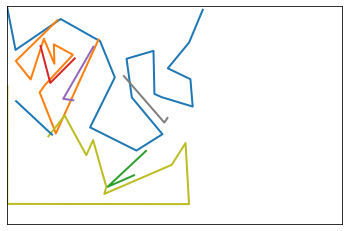

In [ ]:
plot_strokes(rescaled_strokes)

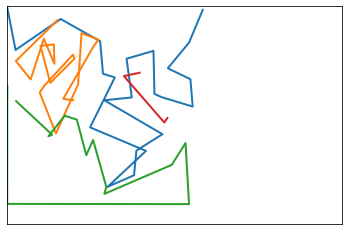

In [ ]:
plot_strokes(spliced_strokes)

In [ ]:
#| hide
import nbdev

nbdev.nbdev_export()